## **Connecting to Google Drive**

In [ ]:
# Import the drive module from google.colab to mount Google Drive
from google.colab import drive

# Mount Google Drive to the Colab environment
# This will prompt you to authorize access to your Google Drive account
drive.mount('/content/drive')

# Define the path to the training dataset located in Google Drive
data_root = '/content/drive/MyDrive/animal/Train'

# Define the path to the test dataset located in Google Drive
data_test = '/content/drive/MyDrive/animal/Test'


Mounted at /content/drive


## **Python Liabrires**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import cv2
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
import warnings
warnings.filterwarnings('ignore')

from sklearn.metrics import confusion_matrix, classification_report, precision_recall_fscore_support
from sklearn.utils import class_weight

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation, BatchNormalization, Conv2D, Dense, Dropout, Flatten, MaxPooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models , regularizers, optimizers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications import InceptionV3

## **Data Preprocessing**

In [ ]:
# Define image dimensions and batch size
img_width, img_height = 150, 150
batch_size = 64
Training_data_dir = str(data_root)
Testing_data_dir = str(data_test)

# Data Augmentation for the training set
# The ImageDataGenerator will apply random transformations to the training images
# This helps in reducing overfitting and improving the model's generalization
train_datagen = ImageDataGenerator(
    rotation_range=10,
    rescale=1.0/255,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

validation_datagen = ImageDataGenerator(rescale=1.0/255,validation_split=.20)
test_datagen = ImageDataGenerator(rescale=1.0/255)


# Data generator for the training set
train_generator = train_datagen.flow_from_directory(
    Training_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    subset="training",
    class_mode='categorical',
    shuffle=True)

# Data generator for the validation set
validation_generator = validation_datagen.flow_from_directory(
    Training_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    subset="validation",
    class_mode='categorical',
    shuffle=True)

# Data generator for the test set
test_generator = test_datagen.flow_from_directory(
    Testing_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False)

# Map class indices to their respective class labels
labels = {value: key for key, value in train_generator.class_indices.items()}

# Print the label mappings to understand which index corresponds to which class
print("Label Mappings for classes present in the training and validation datasets\n")
for key, value in labels.items():
    print(f"{key} : {value}")


Found 5964 images belonging to 6 classes.
Found 1191 images belonging to 6 classes.
Found 759 images belonging to 6 classes.
Label Mappings for classes present in the training and validation datasets

0 : Cheetah
1 : Elephant
2 : Giraffe
3 : Lion
4 : Rhino
5 : Zebra


 This cell sets up the image preprocessing and data augmentation pipeline. It configures ImageDataGenerator to apply transformations to training images (e.g., rotation, scaling, flipping) for better generalization. It then creates data generators for training, validation, and testing datasets, allowing efficient loading and preprocessing.

## **Class Weight**

In [ ]:
# Calculate class weights to handle class imbalance
# This ensures that classes with fewer samples are given higher weight during training
# 'balanced' mode uses the formula: n_samples / (n_classes * np.bincount(y))
class_weights = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)

# Convert class weights to a dictionary format required by Keras
class_weights_dict = {i: class_weights[i] for i in range(len(class_weights))}
print("Class Weights:", class_weights_dict)

Class Weights: {0: 1.1721698113207548, 1: 1.0463157894736843, 2: 1.004040404040404, 3: 0.9851337958374629, 4: 0.9019963702359347, 5: 0.9333333333333333}


## **Visualization**

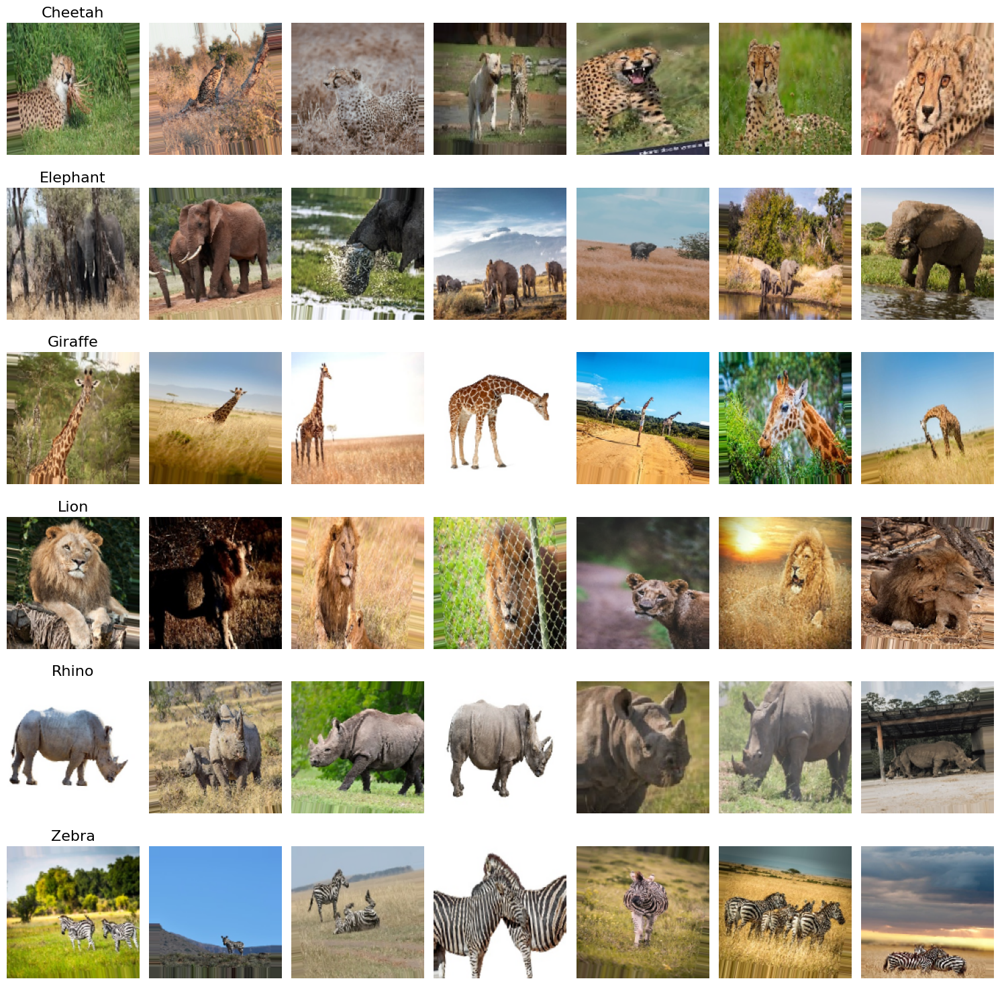

In [ ]:
# Function to plot images in a grid
def plot_images(images, labels, class_names, num_classes, num_images_per_class):
    fig, axes = plt.subplots(num_classes, num_images_per_class, figsize=(15, 15))

    for i in range(num_classes):
        class_images = images[labels == i][:num_images_per_class]
        for j in range(num_images_per_class):
            if j < len(class_images):
                axes[i, j].imshow(class_images[j])
            axes[i, j].axis('off')
            if j == 0:
                axes[i, j].set_title(class_names[i], fontsize=16)

    plt.tight_layout()
    plt.show()

# Extract a batch of images and their labels from the generator
num_classes = len(labels)
num_images_per_class = 7
all_images = []
all_labels = []

# Iterate through the data until we have enough images for each class
for _ in range(int(np.ceil(num_classes * num_images_per_class / batch_size))):
    images, image_labels = next(train_generator)
    all_images.append(images)
    all_labels.append(image_labels)

# Concatenate all images and labels
all_images = np.concatenate(all_images)
all_labels = np.concatenate(all_labels)

# Convert one-hot labels to class indices
all_labels = np.argmax(all_labels, axis=1)

# Get class names
class_names = [labels[i] for i in range(num_classes)]

# Plot the images
plot_images(all_images, all_labels, class_names, num_classes, num_images_per_class)


## **Base CNN Model**

### Training

In [ ]:
# Function to create a CNN model
def create_model():
    # Initialize a sequential model
    model = Sequential([
        # First convolutional layer
        Conv2D(filters=64, kernel_size=(5, 5), padding='valid', input_shape=(img_width, img_height, 3)),
        Activation('relu'),                        # Apply ReLU activation function
        MaxPooling2D(pool_size=(2, 2)),            # Max pooling with a 2x2 filter to reduce spatial dimensions
        BatchNormalization(),                      # Batch normalization for faster convergence and stability

        # Second convolutional layer
        Conv2D(filters=128, kernel_size=(3, 3), padding='valid', kernel_regularizer=l2(0.00005)),
        Activation('relu'),                        # Apply ReLU activation function
        MaxPooling2D(pool_size=(2, 2)),            # Max pooling with a 2x2 filter
        BatchNormalization(),                      # Batch normalization

        # Flatten the output from the convolutional layers to feed into the fully connected layer
        Flatten(),

        # Fully connected layer with 2048 units and ReLU activation
        Dense(units=2048, activation='relu'),
        Dropout(0.5),                              # Dropout for regularization to prevent overfitting

        # Output layer with softmax activation for multi-class classification (6 classes)
        Dense(units=6, activation='softmax')
    ])

    return model

# Create the CNN model
cnn_model = create_model()
print(cnn_model.summary())

# Set up a learning rate reduction callback
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=np.sqrt(0.1), patience=5)

# Compile the model with the Adam optimizer, categorical crossentropy loss, and accuracy metric
optimizer = Adam(learning_rate=0.001)
cnn_model.compile(optimizer=optimizer, loss=CategoricalCrossentropy(), metrics=['accuracy'])

# Train the model using the training data generator
history = cnn_model.fit(train_generator,
                        epochs=50,
                        validation_data=validation_generator,
                        verbose=2,
                        callbacks=[reduce_lr],
                        class_weight=class_weights_dict
                      )

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 146, 146, 64)        │           4,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 146, 146, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 73, 73, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 73, 73, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 71, 71, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 71, 71, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 35, 35, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 35, 35, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 156800)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 2048)                │     321,128,448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 6)                   │          12,294 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 321,220,230 (1.20 GB)

 Trainable params: 321,219,846 (1.20 GB)

 Non-trainable params: 384 (1.50 KB)

None
Epoch 1/50
83/83 - 4570s - 55s/step - accuracy: 0.4323 - loss: 42.0041 - val_accuracy: 0.2639 - val_loss: 16.3267 - learning_rate: 0.0010
Epoch 2/50
83/83 - 53s - 644ms/step - accuracy: 0.5007 - loss: 12.7158 - val_accuracy: 0.1495 - val_loss: 9.5757 - learning_rate: 0.0010
Epoch 3/50
83/83 - 53s - 641ms/step - accuracy: 0.5089 - loss: 4.6345 - val_accuracy: 0.1686 - val_loss: 8.2983 - learning_rate: 0.0010
Epoch 4/50
83/83 - 53s - 637ms/step - accuracy: 0.5439 - loss: 1.9386 - val_accuracy: 0.1442 - val_loss: 3.4014 - learning_rate: 0.0010
Epoch 5/50
83/83 - 53s - 640ms/step - accuracy: 0.5928 - loss: 1.4229 - val_accuracy: 0.2387 - val_loss: 3.1628 - learning_rate: 0.0010
Epoch 6/50
83/83 - 54s - 648ms/step - accuracy: 0.6183 - loss: 1.1303 - val_accuracy: 0.3196 - val_loss: 2.0880 - learning_rate: 0.0010
Epoch 7/50
83/83 - 53s - 644ms/step - accuracy: 0.6606 - loss: 1.0037 - val_accuracy: 0.5271 - val_loss: 1.2509 - learning_rate: 0.0010
Epoch 8/50
83/83 - 53s - 642ms/step - ac

### Evaluation

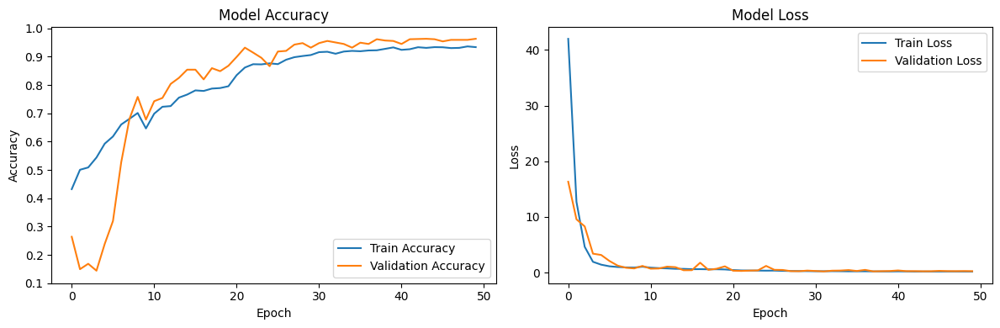

--------------------------------------------------------------------------------------------------
Results for Multi-Class Classification Model:
83/83 ━━━━━━━━━━━━━━━━━━━━ 54s 640ms/step
83/83 ━━━━━━━━━━━━━━━━━━━━ 53s 631ms/step - accuracy: 0.9739 - loss: 0.0975
Training Loss:     0.1005374938249588
Training Accuracy: 0.9731911420822144
--------------------------------------------------------------------------------------------------
17/17 ━━━━━━━━━━━━━━━━━━━━ 4s 250ms/step
17/17 ━━━━━━━━━━━━━━━━━━━━ 4s 229ms/step - accuracy: 0.9629 - loss: 0.2909
Validation Loss:     0.2560800015926361
Validation Accuracy: 0.9633867144584656
--------------------------------------------------------------------------------------------------
10/10 ━━━━━━━━━━━━━━━━━━━━ 457s 51s/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 329ms/step - accuracy: 0.8619 - loss: 1.8164
Testing Loss:     1.096642255783081
Testing Accuracy: 0.8833552002906799
------------------------------------------------------------------------------

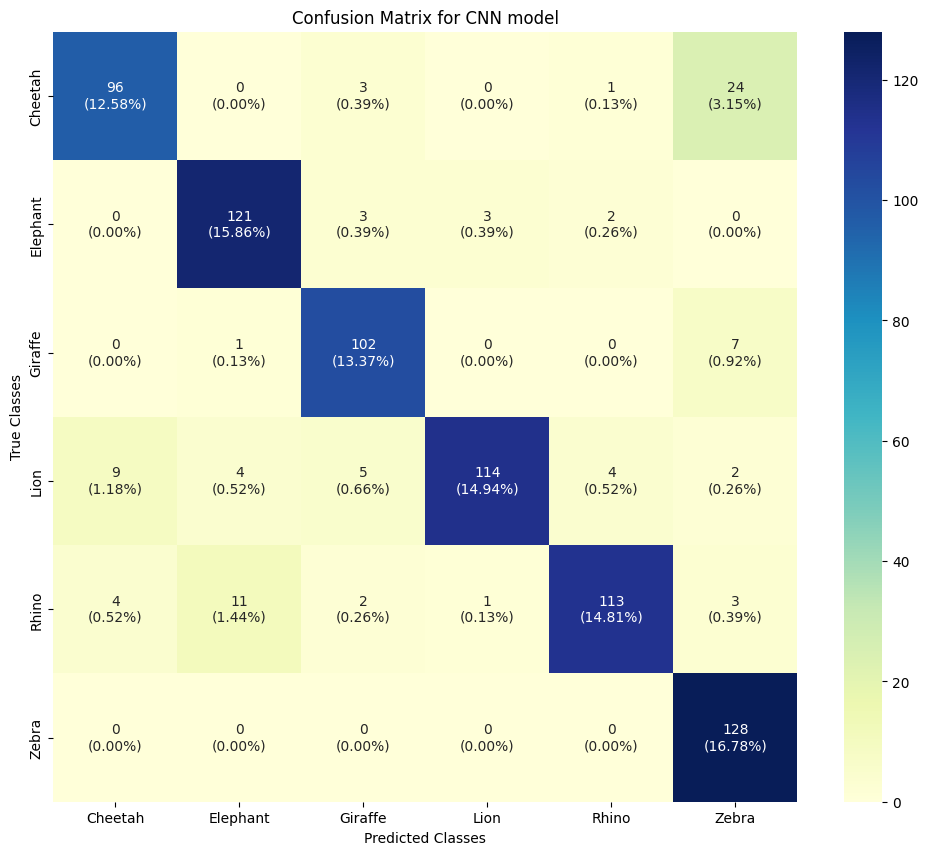

In [ ]:
# Extract the history data
history = history.history

# Plot training & validation accuracy values
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history['accuracy'], label='Train Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='best')
plt.yticks([0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1])

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history['loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='best')

# Show the plots
plt.tight_layout()
plt.show()

print("--------------------------------------------------------------------------------------------------")
print("Results for Multi-Class Classification Model:")
## Calculating Training loss and accuracy.
predictions = cnn_model.predict(train_generator)
train_loss, train_accuracy = cnn_model.evaluate(train_generator, batch_size=batch_size)
print(f"Training Loss:     {train_loss}")
print(f"Training Accuracy: {train_accuracy}")
print("--------------------------------------------------------------------------------------------------")

# Calculating Validation loss and accuracy.
predictions = cnn_model.predict(validation_generator)
Validation_loss, Validation_accuracy = cnn_model.evaluate(validation_generator, batch_size=batch_size)
print(f"Validation Loss:     {Validation_loss}")
print(f"Validation Accuracy: {Validation_accuracy}")
print("--------------------------------------------------------------------------------------------------")

# Calculating Testing loss and accuracy.
predictions = cnn_model.predict(test_generator)
test_loss, test_accuracy = cnn_model.evaluate(test_generator, batch_size=batch_size)
print(f"Testing Loss:     {test_loss}")
print(f"Testing Accuracy: {test_accuracy}")
print("--------------------------------------------------------------------------------------------------")

y_pred = np.argmax(predictions, axis=1)
y_true = test_generator.classes

## Calculating Precision, recall and F1-score.
precision, recall, f1_score, _ = precision_recall_fscore_support(y_true, y_pred, average='weighted')
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1_score}")
print("--------------------------------------------------------------------------------------------------")


## Classification Report
print(classification_report(y_true, y_pred, target_names=labels.values()))
print("--------------------------------------------------------------------------------------------------")

## Plotting Confusion Matrix
cf_mtx = confusion_matrix(y_true, y_pred)

group_counts = ["{0:0.0f}".format(value) for value in cf_mtx.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in cf_mtx.flatten()/np.sum(cf_mtx)]
box_labels = [f"{v1}\n({v2})" for v1, v2 in zip(group_counts, group_percentages)]
box_labels = np.asarray(box_labels).reshape(6, 6)
plt.figure(figsize = (12, 10))
sns.heatmap(cf_mtx, xticklabels=labels.values(), yticklabels=labels.values(),
           cmap="YlGnBu", fmt="", annot=box_labels)
plt.title("Confusion Matrix for CNN model")
plt.xlabel('Predicted Classes')
plt.ylabel('True Classes')
plt.show()



2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step 
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


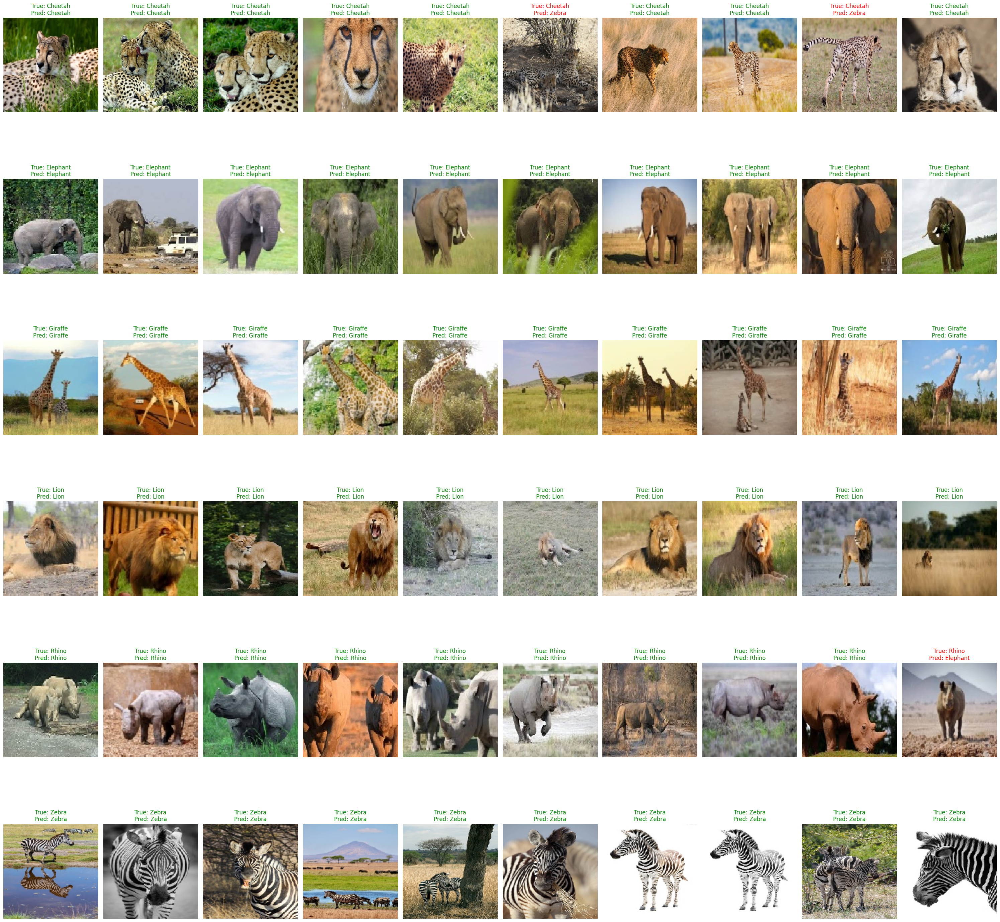

In [ ]:
def display_predictions_per_class(model, generator, class_labels, num_images_per_class=8):
    # Initialize lists to collect images, true classes, and predicted classes for each species
    image_batch = {label: [] for label in class_labels}
    true_classes_batch = {label: [] for label in class_labels}
    predicted_classes_batch = {label: [] for label in class_labels}

    # Number of classes
    num_classes = len(class_labels)

    # Continue extracting batches until we have enough images for each class
    while any(len(images) < num_images_per_class for images in image_batch.values()):
        images, labels = next(generator)
        true_classes = np.argmax(labels, axis=1)
        predictions = model.predict(images)
        predicted_classes = np.argmax(predictions, axis=1)

        for i in range(len(images)):
            true_label = class_labels[true_classes[i]]
            if len(image_batch[true_label]) < num_images_per_class:
                image_batch[true_label].append(images[i])
                true_classes_batch[true_label].append(true_classes[i])
                predicted_classes_batch[true_label].append(predicted_classes[i])

    # Plotting the images in a grid with their true and predicted labels
    plt.figure(figsize=(30, num_classes * 5))

    image_count = 0
    for idx, label in enumerate(class_labels):
        for i in range(num_images_per_class):
            image_count += 1
            ax = plt.subplot(num_classes, num_images_per_class, image_count)
            plt.imshow(image_batch[label][i])

            true_label = class_labels[true_classes_batch[label][i]]
            predicted_label = class_labels[predicted_classes_batch[label][i]]
            color = "green" if true_label == predicted_label else "red"

            plt.title(f"True: {true_label}\nPred: {predicted_label}", color=color)
            plt.axis("off")

    plt.tight_layout()
    plt.show()

# Display predictions for 10 images of each class from the test generator
class_labels = list(test_generator.class_indices.keys())
display_predictions_per_class(cnn_model, test_generator, class_labels, num_images_per_class=10)
